# FACE CLASSIFICATION

### **AMERICAN INTERNATIONAL UNIVERSITY-BANGLADESH (AIUB)**  
**Name:** RIFAT TALUKDAR  
**ID:** 22-46428-1  
**Course:** COMPUTER VISION AND PATTERN RECOGNITION  
**Section:** A  
**Course Teacher:** DR. DEBAJYOTI KARMAKER  

---

**Assignment 1**

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import pickle
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping

np.random.seed(42)
tf.random.set_seed(42)

plt.style.use('ggplot')

# Data Loading and Preprocessing

In [ ]:
def load_and_split_dataset(data_dir, test_size=0.2, img_size=(160, 160)):
    all_faces = []
    all_labels = []
    label_dict = {}

    person_folders = sorted(os.listdir(data_dir))

    for label, person_name in enumerate(person_folders):
        person_dir = os.path.join(data_dir, person_name)
        if os.path.isdir(person_dir):
            display_name = person_name.replace('_', ' ')
            label_dict[label] = display_name

            image_files = [f for f in os.listdir(person_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]

            train_files, val_files = train_test_split(image_files, test_size=test_size, random_state=42, stratify=None)

            for image_file in train_files + val_files:
                image_path = os.path.join(person_dir, image_file)
                image = cv2.imread(image_path)
                if image is not None:
                    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
                    image = cv2.resize(image, img_size)
                    all_faces.append(image)
                    all_labels.append(label)

    X = np.array(all_faces).astype('float32') / 255.0
    y = np.array(all_labels)

    X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=test_size, random_state=42, stratify=None)
    return X_train, X_val, y_train, y_val, label_dict

In [ ]:
data_dir = '/content/drive/MyDrive/Colab Notebooks/CVPR/Face Recognition/data'
img_size = (160, 160)
X_train, X_val, y_train, y_val, label_dict = load_and_split_dataset(data_dir, img_size=img_size)

In [ ]:
print("\nDataset Statistics:")
print(f"Total images: {len(X_train) + len(X_val)}")
print(f"Training images: {len(X_train)} ({len(X_train)/(len(X_train)+len(X_val)):.0%})")
print(f"Validation images: {len(X_val)} ({len(X_val)/(len(X_train)+len(X_val)):.0%})")
print("\nClass distribution in training set:")
unique, counts = np.unique(y_train, return_counts=True)
for label, count in zip(unique, counts):
    print(f"{label_dict[label]}: {count} images")
print("\nClass distribution in validation set:")
unique, counts = np.unique(y_val, return_counts=True)
for label, count in zip(unique, counts):
    print(f"{label_dict[label]}: {count} images")


Dataset Statistics:
Total images: 750
Training images: 600 (80%)
Validation images: 150 (20%)

Class distribution in training set:
azminur: 198 images
rifat: 195 images
saikot: 207 images

Class distribution in validation set:
azminur: 52 images
rifat: 55 images
saikot: 43 images


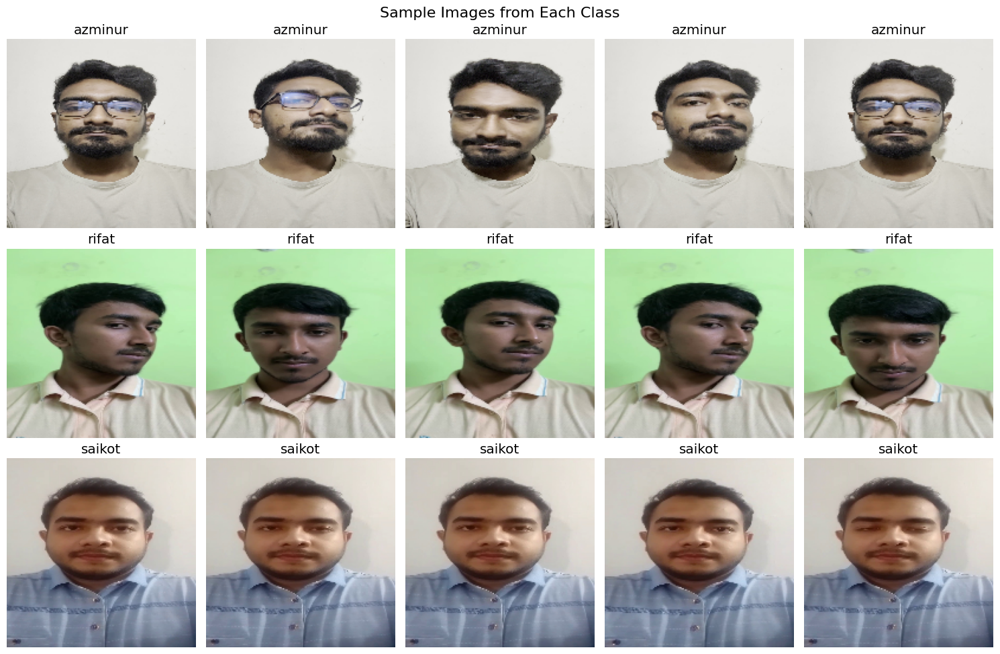

In [ ]:
def plot_images_from_each_class(X, y, label_dict, num_images_per_class):
    unique_classes = np.unique(y)
    plt.figure(figsize=(15, 10))
    plt.suptitle('Sample Images from Each Class', fontsize=16)

    for i, class_label in enumerate(unique_classes):
        class_indices = np.where(y == class_label)[0]
        sampled_indices = np.random.choice(class_indices, min(num_images_per_class, len(class_indices)), replace=False)

        for j, index in enumerate(sampled_indices):
            plt.subplot(len(unique_classes), num_images_per_class, i * num_images_per_class + j + 1)
            plt.imshow(X[index])
            plt.title(f'{label_dict[class_label]}')
            plt.axis('off')

    plt.tight_layout()
    plt.show()

plot_images_from_each_class(X_train, y_train, label_dict, 5)

# Model Creation (Custom CNN from Scratch)

In [ ]:
def create_custom_model(input_shape, num_classes):
    model = models.Sequential([
        layers.Conv2D(32, (3, 3), activation='relu', input_shape=input_shape),
        layers.BatchNormalization(),
        layers.Conv2D(32, (3, 3), activation='relu'),
        layers.BatchNormalization(),
        layers.MaxPooling2D((2, 2)),
        layers.Dropout(0.25),

        layers.Conv2D(64, (3, 3), activation='relu'),
        layers.BatchNormalization(),
        layers.Conv2D(64, (3, 3), activation='relu'),
        layers.BatchNormalization(),
        layers.MaxPooling2D((2, 2)),
        layers.Dropout(0.35),

        layers.Conv2D(128, (3, 3), activation='relu'),
        layers.BatchNormalization(),
        layers.MaxPooling2D((2, 2)),
        layers.Dropout(0.40),

        layers.Flatten(),
        layers.Dense(128, activation='relu'),
        layers.BatchNormalization(),
        layers.Dropout(0.5),
        layers.Dense(num_classes, activation='softmax')
    ])

    model.compile(
        optimizer=Adam(learning_rate=0.0001),
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )

    return model

In [ ]:
num_classes = len(label_dict)
input_shape = (*img_size, 3)
print("\nDataset Info:")
print(f"X_train shape: {X_train.shape}, y_train shape: {y_train.shape}")
print(f"X_val shape: {X_val.shape}, y_val shape: {y_val.shape}")
print(f"Number of classes: {num_classes}")
print(f"Input shape: {input_shape}")


Dataset Info:
X_train shape: (600, 160, 160, 3), y_train shape: (600,)
X_val shape: (150, 160, 160, 3), y_val shape: (150,)
Number of classes: 3
Input shape: (160, 160, 3)


In [ ]:
model = create_custom_model(input_shape, num_classes)

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [ ]:
print("\nModel Summary")
model.summary()


Model Summary


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 158, 158, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 158, 158, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 156, 156, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 156, 156, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 78, 78, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 78, 78, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 76, 76, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 76, 76, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 74, 74, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 74, 74, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 37, 37, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 37, 37, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 35, 35, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 35, 35, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 17, 17, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 17, 17, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 36992)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │     4,735,104 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 128)            │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 3)              │           387 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,876,707 (18.60 MB)

 Trainable params: 4,875,811 (18.60 MB)

 Non-trainable params: 896 (3.50 KB)

In [ ]:
try:
    tf.keras.utils.plot_model(model, show_shapes=True, expand_nested=True)
except Exception as e:
    print(f"Error plotting model: {e}")

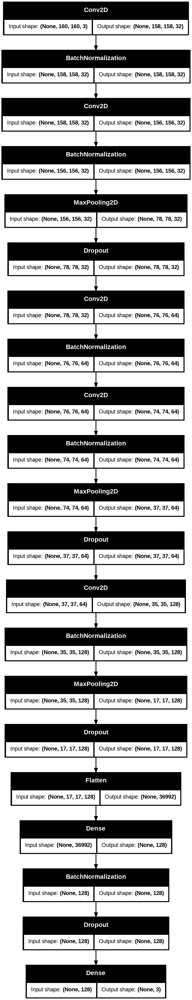

In [ ]:
from IPython.display import Image
Image(filename='model.png')

In [ ]:
train_datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.15,
    zoom_range=0.15,
    horizontal_flip=True,
    fill_mode='nearest'
)

In [ ]:
batch_size = 32
epochs = 30

In [ ]:
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

In [ ]:
history = model.fit(
    train_datagen.flow(X_train, tf.keras.utils.to_categorical(y_train, num_classes), batch_size=batch_size),
    steps_per_epoch=len(X_train) // batch_size,
    epochs=epochs,
    validation_data=(X_val, tf.keras.utils.to_categorical(y_val, num_classes)),
    verbose=1,
    callbacks=[early_stopping]
)

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/30
18/18 ━━━━━━━━━━━━━━━━━━━━ 108s 6s/step - accuracy: 0.7496 - loss: 0.7812 - val_accuracy: 0.3467 - val_loss: 1.1659
Epoch 2/30
 1/18 ━━━━━━━━━━━━━━━━━━━━ 1:39 6s/step - accuracy: 0.9688 - loss: 0.0483

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:107: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


18/18 ━━━━━━━━━━━━━━━━━━━━ 11s 302ms/step - accuracy: 0.9688 - loss: 0.0483 - val_accuracy: 0.3467 - val_loss: 1.1680
Epoch 3/30
18/18 ━━━━━━━━━━━━━━━━━━━━ 142s 6s/step - accuracy: 0.9934 - loss: 0.0285 - val_accuracy: 0.3467 - val_loss: 1.1686
Epoch 4/30
18/18 ━━━━━━━━━━━━━━━━━━━━ 11s 263ms/step - accuracy: 1.0000 - loss: 0.0146 - val_accuracy: 0.3467 - val_loss: 1.1749
Epoch 5/30
18/18 ━━━━━━━━━━━━━━━━━━━━ 103s 6s/step - accuracy: 1.0000 - loss: 0.0046 - val_accuracy: 0.3467 - val_loss: 1.1612
Epoch 6/30
18/18 ━━━━━━━━━━━━━━━━━━━━ 11s 303ms/step - accuracy: 1.0000 - loss: 0.0092 - val_accuracy: 0.3467 - val_loss: 1.1637
Epoch 7/30
18/18 ━━━━━━━━━━━━━━━━━━━━ 131s 6s/step - accuracy: 0.9986 - loss: 0.0060 - val_accuracy: 0.3467 - val_loss: 1.1597
Epoch 8/30
18/18 ━━━━━━━━━━━━━━━━━━━━ 11s 303ms/step - accuracy: 1.0000 - loss: 4.4212e-04 - val_accuracy: 0.3467 - val_loss: 1.1531
Epoch 9/30
18/18 ━━━━━━━━━━━━━━━━━━━━ 103s 6s/step - accuracy: 0.9990 - loss: 0.0022 - val_accuracy: 0.3467 - 

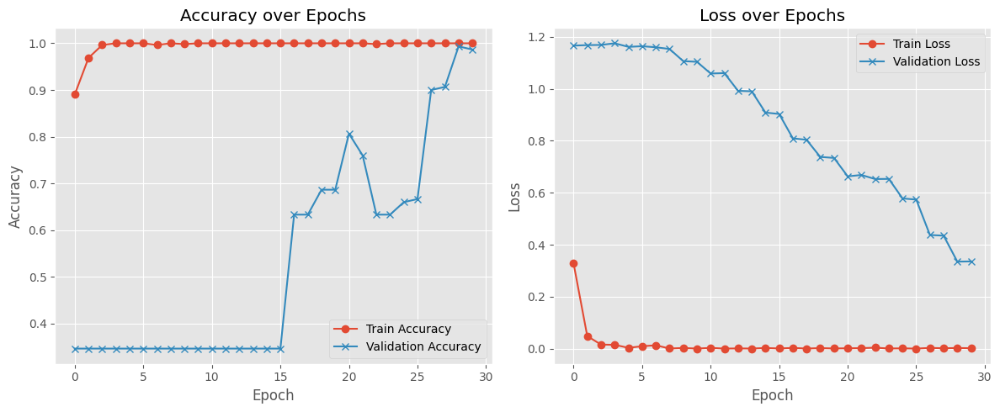

In [ ]:
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], 'o-', label='Train Accuracy')
plt.plot(history.history['val_accuracy'], 'x-', label='Validation Accuracy')
plt.title('Accuracy over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.grid(True)
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], 'o-', label='Train Loss')
plt.plot(history.history['val_loss'], 'x-', label='Validation Loss')
plt.title('Loss over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.grid(True)
plt.legend()

plt.tight_layout()
plt.show()

In [ ]:
predictions = model.predict(X_val)

5/5 ━━━━━━━━━━━━━━━━━━━━ 4s 876ms/step


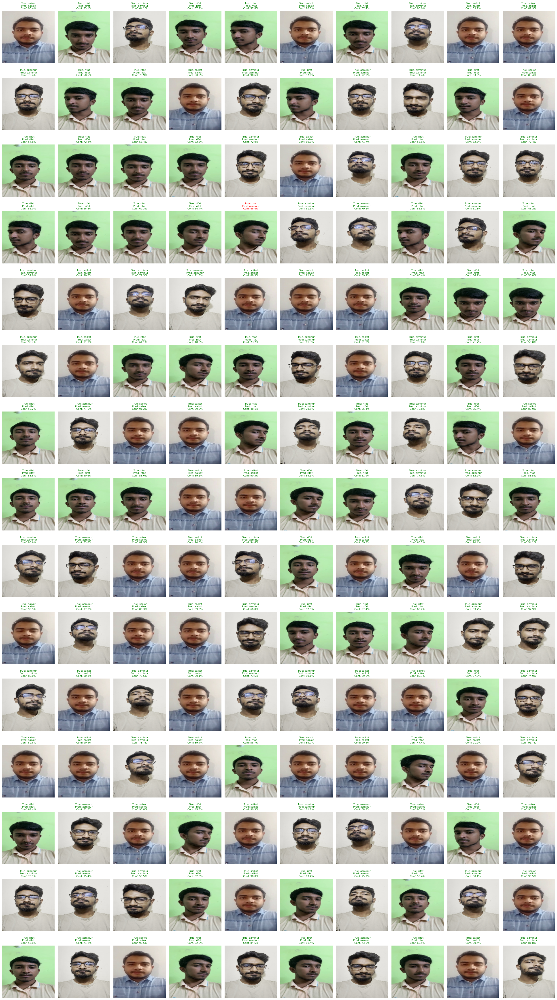

In [ ]:
def visualize_predictions(X_val, y_val, predictions, label_dict, num_images=150):
    num_images_to_show = min(num_images, len(X_val))
    num_cols = 10
    num_rows = (num_images_to_show + num_cols - 1) // num_cols
    plt.figure(figsize=(num_cols * 2.5, num_rows * 3))
    predicted_classes = np.argmax(predictions, axis=1)
    confidences = np.max(predictions, axis=1)

    for i in range(num_images_to_show):
        plt.subplot(num_rows, num_cols, i + 1)
        plt.imshow(X_val[i])
        true_label = label_dict[y_val[i]]
        predicted_label = label_dict[predicted_classes[i]]
        confidence = confidences[i] * 100

        color = 'green' if true_label == predicted_label else 'red'

        plt.title(f'True: {true_label}\nPred: {predicted_label}\nConf: {confidence:.1f}%', color=color, fontsize=8)
        plt.axis('off')

    plt.tight_layout()
    plt.show()

visualize_predictions(X_val, y_val, predictions, label_dict, num_images=150)

In [ ]:
model.save('face_recognition_model.keras')
with open('label_dict.pkl', 'wb') as f:
  pickle.dump(label_dict, f)